In [2]:
import tensorflow as tf
import numpy as np
from matplotlib import pyplot as plt
import cv2
import os


In [3]:
# Load your dataset here
def load_test_and_heatmaps(test_folder, heatmap_folder):
    test_images = []
    heatmap_images = []

    for i in range(1, 23):
        # Load test image
        test_img = cv2.imread(os.path.join(test_folder, f"{i}.png"))
        test_images.append(test_img)

        # Load heatmap image
        heatmap_img = cv2.imread(os.path.join(heatmap_folder, f"Heatmap{i}.png"))
        heatmap_images.append(heatmap_img)

    test_images = np.array(test_images, dtype='object')
    heatmap_images = np.array(heatmap_images, dtype='object')

    return test_images, heatmap_images


In [4]:
def preprocess_data(images, points_of_interest):
    # Resize and normalize images
    resized_images = []
    for img in images:
        resized_img = cv2.resize(img, (640, 480), interpolation=cv2.INTER_AREA)
        resized_images.append(resized_img)
    resized_images = np.array(resized_images).astype('float32') / 255.0

    # Scale points of interest
    original_image_size = np.array([1280, 960])
    new_image_size = np.array([640, 480])
    points_of_interest = (points_of_interest / original_image_size) * new_image_size

    return resized_images, points_of_interest

In [5]:
def load_model(model):
    if model == 1:
        return tf.keras.models.load_model('efficientnetb1_points_of_interest_savedmodel')
    elif model == 2:
        return tf.keras.models.load_model('efficientnetb2_points_of_interest_savedmodel')
    elif model == 3:
        return tf.keras.models.load_model('b1model_v2.h5')
    elif model == 4:
        return tf.keras.models.load_model('b2model_v3_2.h5')

In [9]:
 # Load the test and heatmap images
test_folder = 'D:\\CS6795_project\\src\\data\\test_images\\'
heatmap_folder = 'D:\\CS6795_project\\src\\data\\heatmap\\'
test_images, heatmap_images = load_test_and_heatmaps(test_folder, heatmap_folder)

# Preprocess test images
test_images, _ = preprocess_data(test_images, np.empty((0, 2)))

best_model = load_model(3)
best_model.summary()

# Predict fixations
predictions = best_model.predict(test_images)
num_images = len(test_images)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetv2-b1 (Function  (None, 15, 20, 1280)     6931124   
 al)                                                             
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 256)               327936    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               65792     
                                                                 
 dropout_1 (Dropout)         (None, 256)               0

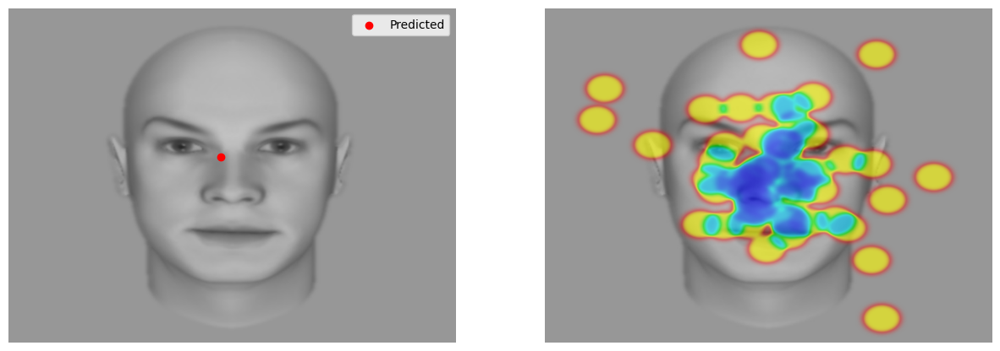

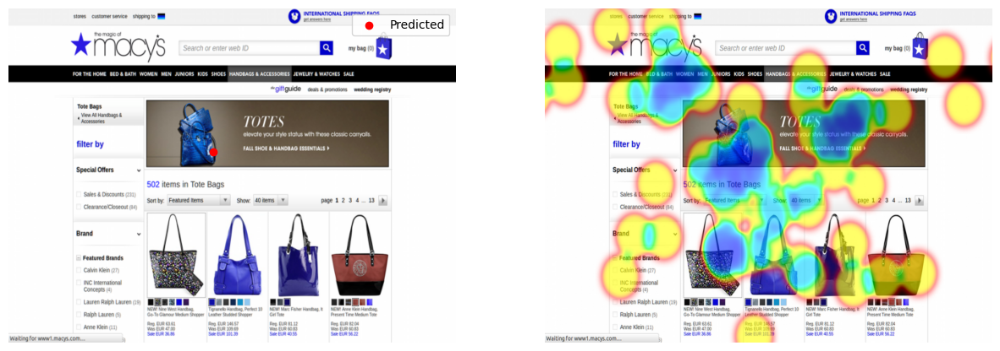

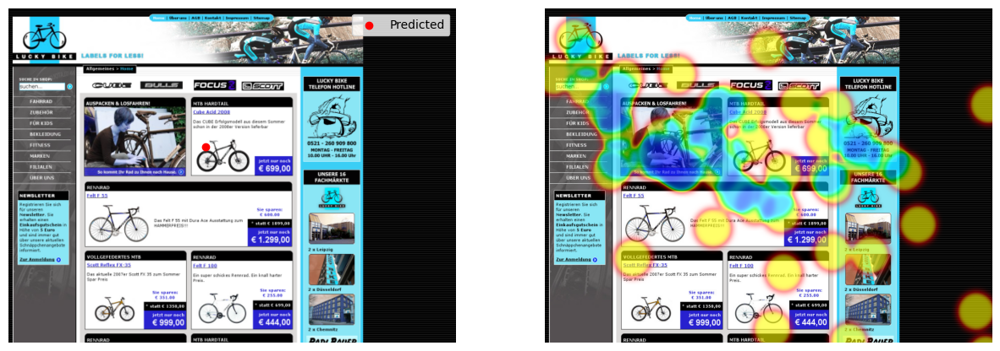

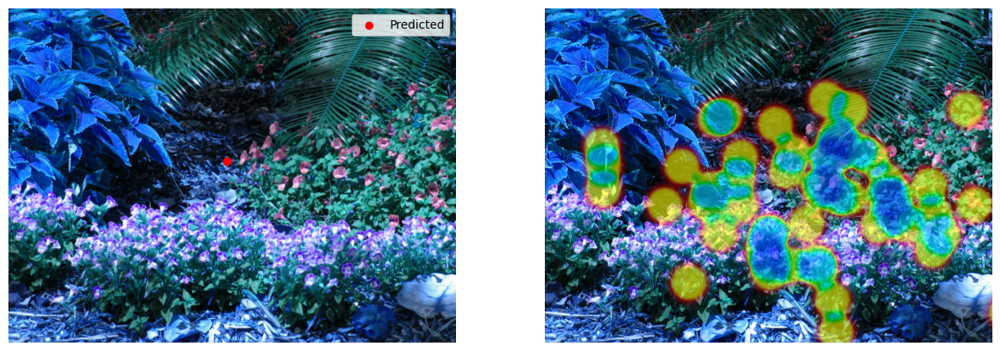

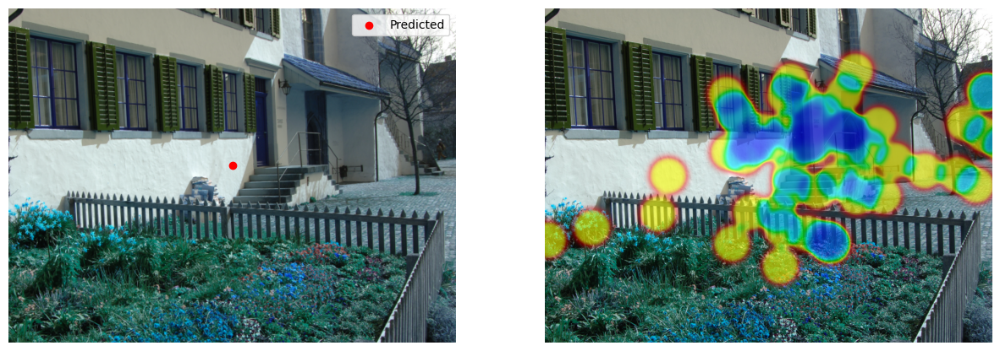

...

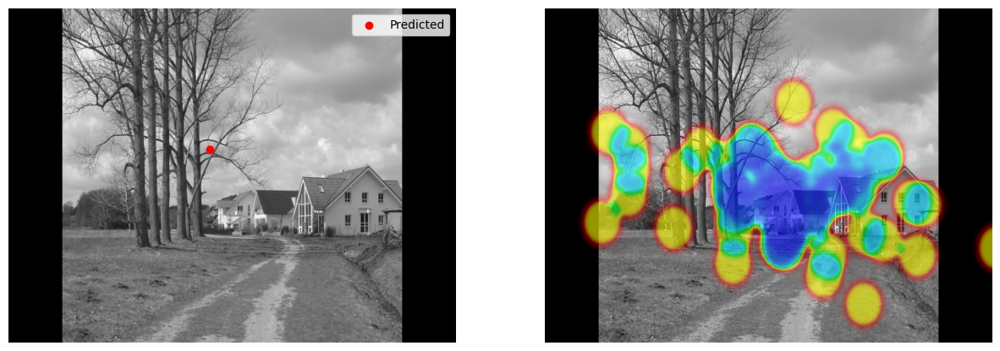

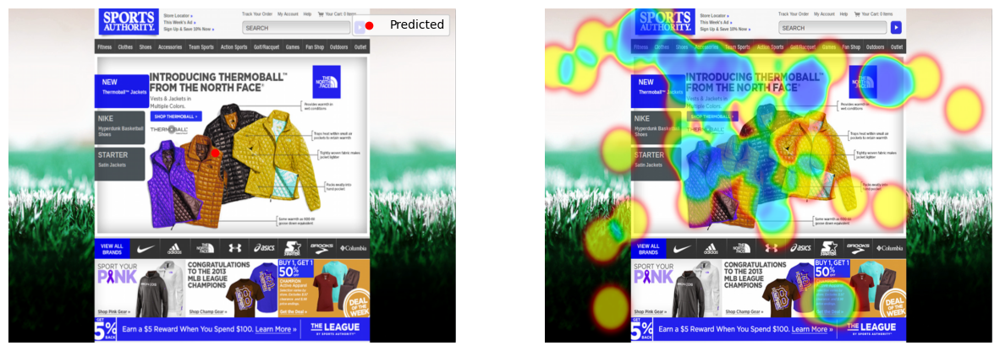

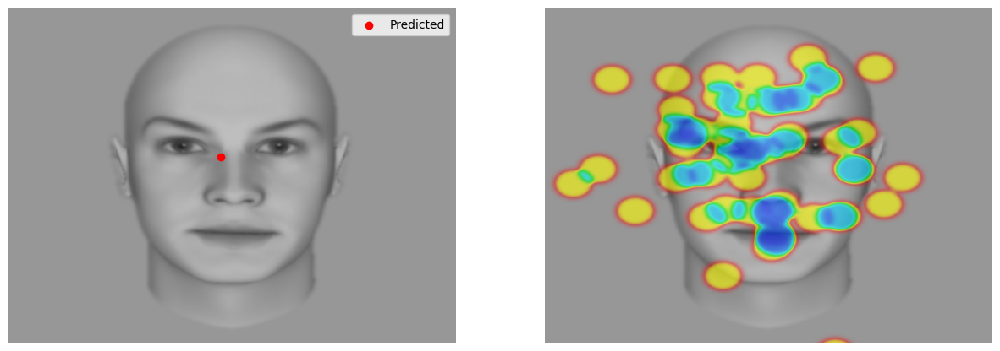

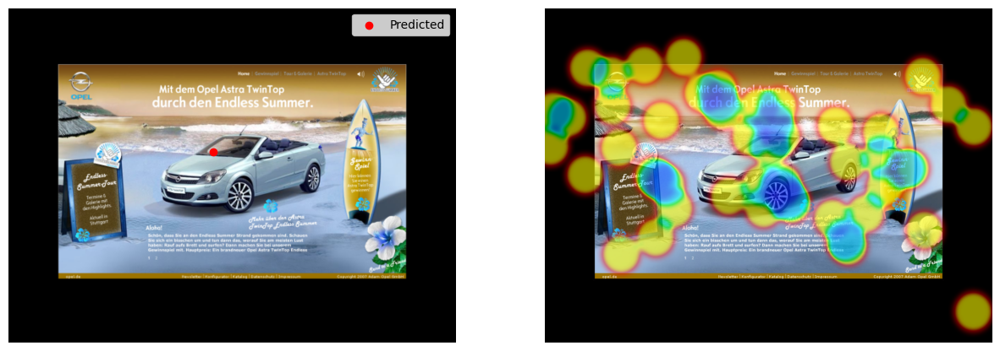

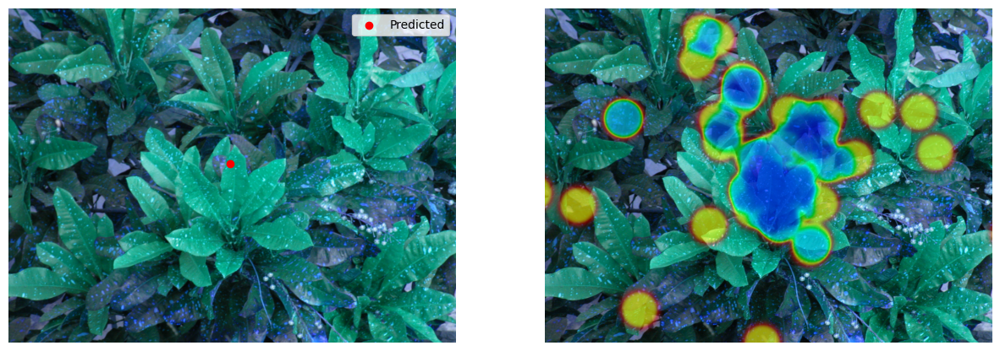

In [10]:
x_scale = 1280 / 640
y_scale = 960 / 480

for i in range(num_images):
    fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))

    # Test image with prediction (scaled back to original size)
    resized_test_image = cv2.resize(test_images[i], (1280, 960), interpolation=cv2.INTER_AREA)
    axs[0].imshow(resized_test_image)
    axs[0].scatter(predictions[i, 0] * x_scale, predictions[i, 1] * y_scale, c='r', marker='o', label='Predicted')
    axs[0].legend()

    # Heatmap (scaled to the same size as the test image)
    resized_heatmap_image = cv2.resize(heatmap_images[i], (1280, 960), interpolation=cv2.INTER_AREA)
    axs[1].imshow(resized_heatmap_image)

    axs[0].axis('off')
    axs[1].axis('off')
    plt.show()

    # plt.savefig(f'B2_image_{i+1}', bbox_inches='tight')